## <h1><center><font color='#33D1FF'>Bike Rental Prediction</font></center></h1>

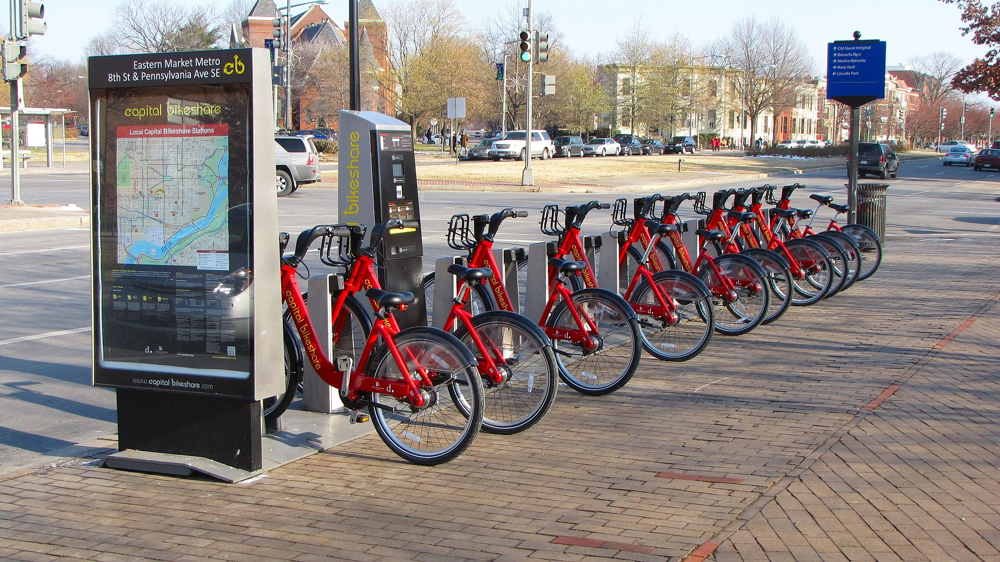

##                                <center><font color='Red'>Purpose Of the Project</font></center>

**1. Many U.S. cities have communal bike sharing stations where you can rent bicycles by the hour or day. Washington, D.C. is one of these cities. The District collects detailed data on the number of bicycles people rent by the hour and day.**

**2. In this project, we'll try to predict the total number of bikes people rented in a given hour. we'll predict the cnt column using all of the other columns, except for casual and registered. To accomplish this, we'll create a few different machine learning models and evaluate their performance.**

## =======================================================================

## About Dataset

###  <font color='Green'>About</font>

**1. Hadi Fanaee-T at the University of Porto compiled this data into a CSV file, which you'll work with in this project. The file contains 17380 rows, with each row representing the number of bike rentals for a single hour of a single day.**

## Description of Columns

1. instant - A unique sequential ID number for each row
2. dteday - The date of the rentals
3. season - The season in which the rentals occurred
4. yr - The year the rentals occurred
5. mnth - The month the rentals occurred
6. hr - The hour the rentals occurred
7. holiday - Whether or not the day was a holiday
8. weekday - The day of the week (as a number, 0 to 7)
9. workingday - Whether or not the day was a working day
10. weathersit - The weather (as a categorical variable)
11. temp - The temperature, on a 0-1 scale
12. atemp - The adjusted temperature
13. hum - The humidity, on a 0-1 scale
14. windspeed - The wind speed, on a 0-1 scale
15. casual - The number of casual riders (people who hadn't previously signed up with the bike sharing program)
16. registered - The number of registered riders (people who had already signed up)
17. cnt - The total number of bike rentals (casual + registered)

## Importing Libraries

In [104]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt 
%matplotlib inline 
sns.set()

import warnings 
warnings.filterwarnings('ignore')

In [105]:
bike_rental = pd.read_csv('bike_rental_hour.csv')

## Exploring Dataset

In [106]:
bike_rental.shape

(17379, 17)

In [107]:
bike_rental.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17379 entries, 0 to 17378
Data columns (total 17 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   instant     17379 non-null  int64  
 1   dteday      17379 non-null  object 
 2   season      17379 non-null  int64  
 3   yr          17379 non-null  int64  
 4   mnth        17379 non-null  int64  
 5   hr          17379 non-null  int64  
 6   holiday     17379 non-null  int64  
 7   weekday     17379 non-null  int64  
 8   workingday  17379 non-null  int64  
 9   weathersit  17379 non-null  int64  
 10  temp        17379 non-null  float64
 11  atemp       17379 non-null  float64
 12  hum         17379 non-null  float64
 13  windspeed   17379 non-null  float64
 14  casual      17379 non-null  int64  
 15  registered  17379 non-null  int64  
 16  cnt         17379 non-null  int64  
dtypes: float64(4), int64(12), object(1)
memory usage: 2.3+ MB


In [108]:
bike_rental.head().style.background_gradient(cmap ='viridis')

,instant,dteday,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
0,1,2011-01-01,1,0,1,0,0,6,0,1,0.240000,0.287900,0.810000,0.000000,3,13,16
1,2,2011-01-01,1,0,1,1,0,6,0,1,0.220000,0.272700,0.800000,0.000000,8,32,40
2,3,2011-01-01,1,0,1,2,0,6,0,1,0.220000,0.272700,0.800000,0.000000,5,27,32
3,4,2011-01-01,1,0,1,3,0,6,0,1,0.240000,0.287900,0.750000,0.000000,3,10,13
4,5,2011-01-01,1,0,1,4,0,6,0,1,0.240000,0.287900,0.750000,0.000000,0,1,1


## Cleaning The Dataset

In [109]:
#remove duplicates   
def drop_duplicates(df):
    if df.duplicated().any() == True:
        print('The total number of duplicated values before removing ',df.duplicated().sum())
        df.drop_duplicates(inplace = True,keep = 'last')
        df = df.reset_index(drop = True)
        print('The total number of duplicate value after removing ',df.duplicated().sum())
    else:
        print('No Duplicate entries found in Dataset')
        

In [110]:
drop_duplicates(bike_rental)

No Duplicate entries found in Dataset


In [111]:
bike_rental['dteday'] = pd.to_datetime(bike_rental['dteday'])

## Checking Null Values

In [112]:
bike_rental.isnull().sum()

instant       0
dteday        0
season        0
yr            0
mnth          0
hr            0
holiday       0
weekday       0
workingday    0
weathersit    0
temp          0
atemp         0
hum           0
windspeed     0
casual        0
registered    0
cnt           0
dtype: int64

## Descriptive Stats

In [113]:
desc = bike_rental.describe().T

<AxesSubplot:>

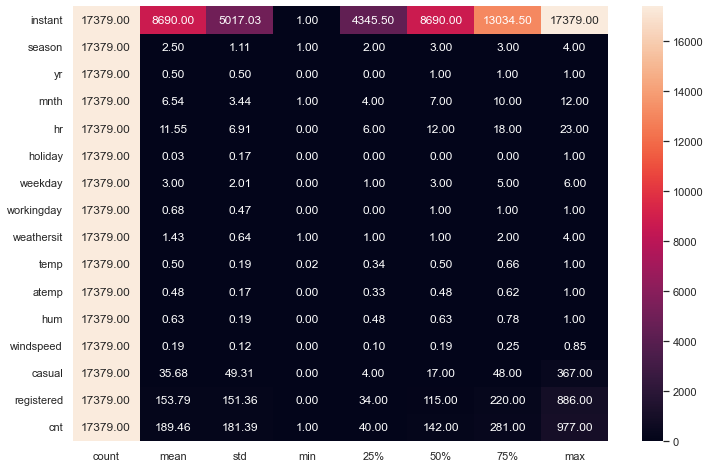

In [114]:
plt.figure(figsize = (12,8))
sns.heatmap(desc,annot = True,fmt = '.2f')

In [115]:
bike_rental.describe()

,instant,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
count,17379.0000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000
mean,8690.0000,2.501640,0.502561,6.537775,11.546752,0.028770,3.003683,0.682721,1.425283,0.496987,0.475775,0.627229,0.190098,35.676218,153.786869,189.463088
std,5017.0295,1.106918,0.500008,3.438776,6.914405,0.167165,2.005771,0.465431,0.639357,0.192556,0.171850,0.192930,0.122340,49.305030,151.357286,181.387599
min,1.0000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.020000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
25%,4345.5000,2.000000,0.000000,4.000000,6.000000,0.000000,1.000000,0.000000,1.000000,0.340000,0.333300,0.480000,0.104500,4.000000,34.000000,40.000000
50%,8690.0000,3.000000,1.000000,7.000000,12.000000,0.000000,3.000000,1.000000,1.000000,0.500000,0.484800,0.630000,0.194000,17.000000,115.000000,142.000000
75%,13034.5000,3.000000,1.000000,10.000000,18.000000,0.000000,5.000000,1.000000,2.000000,0.660000,0.621200,0.780000,0.253700,48.000000,220.000000,281.000000
max,17379.0000,4.000000,1.000000,12.000000,23.000000,1.000000,6.000000,1.000000,4.000000,1.000000,1.000000,1.000000,0.850700,367.000000,886.000000,977.000000


In [116]:
def unique_counts(df):
    unique_counts = df.nunique().sort_values()
    print('=='*30)
    print(' '*10,'Total No Of Unique Values')
    print('=='*30)
    print(unique_counts)
    print('=='*30)
    
    plt.figure(figsize = (12,8))
    sns.barplot(x = unique_counts.index[:-1],y = unique_counts.iloc[:-1])
    plt.title('Total No Of Unique Values',loc = 'center')
    plt.ylabel('Frequency')
    plt.xlabel('Column Name')
    plt.xticks(rotation = 45)
    plt.show()

           Total No Of Unique Values
workingday        2
yr                2
holiday           2
season            4
weathersit        4
weekday           7
mnth             12
hr               24
windspeed        30
temp             50
atemp            65
hum              89
casual          322
dteday          731
registered      776
cnt             869
instant       17379
dtype: int64


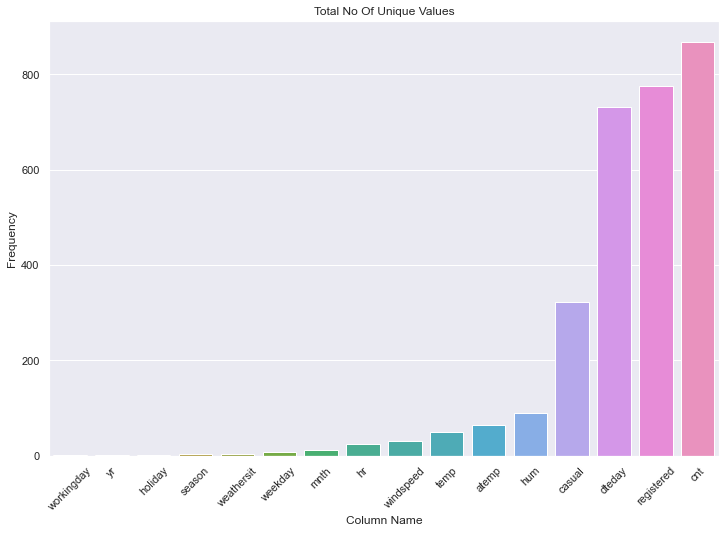

In [117]:
unique_counts(bike_rental)

In [118]:
for i in bike_rental.columns[1:]:
    if len(bike_rental[i].unique()) < 10:
        print(''*10,i)
        print(bike_rental[i].unique())
        print('=='*30)

 season
[1 2 3 4]
 yr
[0 1]
 holiday
[0 1]
 weekday
[6 0 1 2 3 4 5]
 workingday
[0 1]
 weathersit
[1 2 3 4]


In [119]:
def num_dist(column,df):
    plt.figure(figsize = (8,6))
    plt.subplot(1,2,1)
    sns.boxplot(df[column],palette = 'Set2')
    plt.title(column.title())
    
    
    plt.subplot(1,2,2)
    sns.violinplot(df[column],palette = "tab10")
    
    plt.tight_layout()
    plt.show()

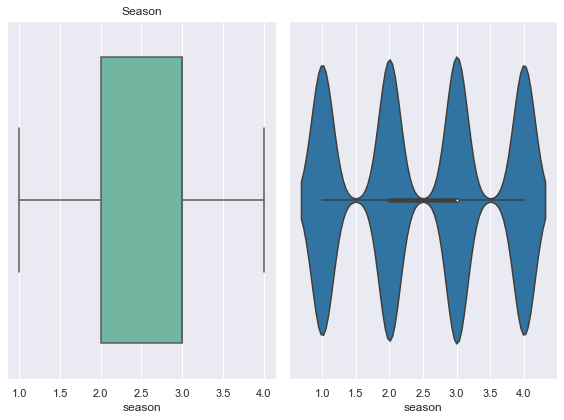

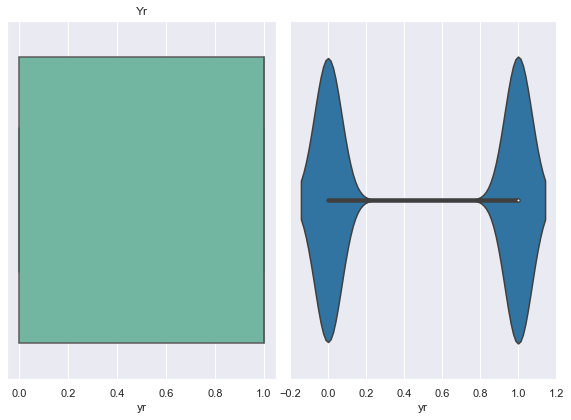

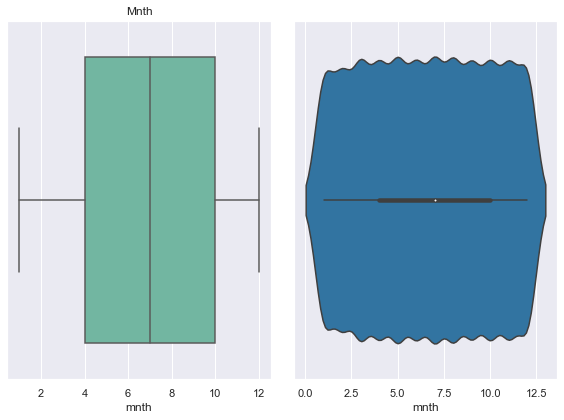

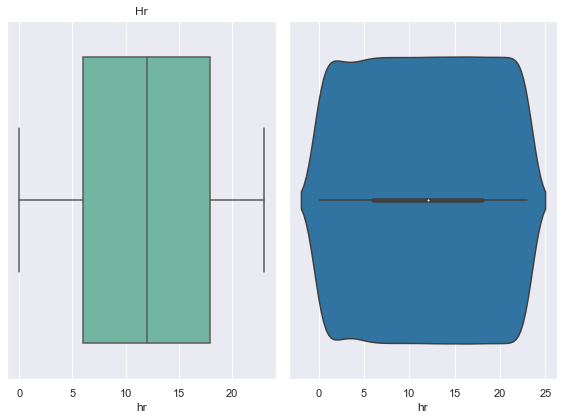

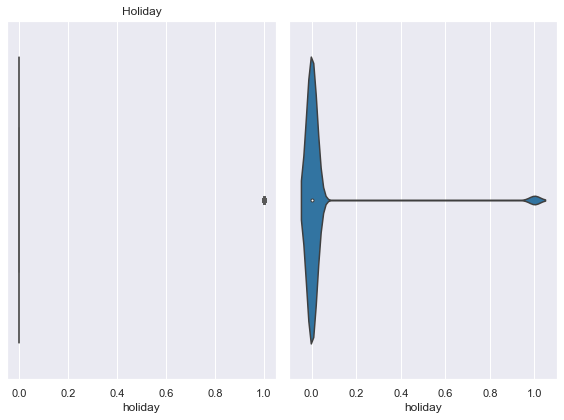

...

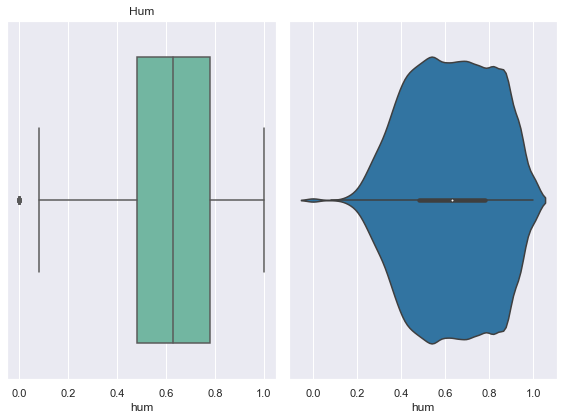

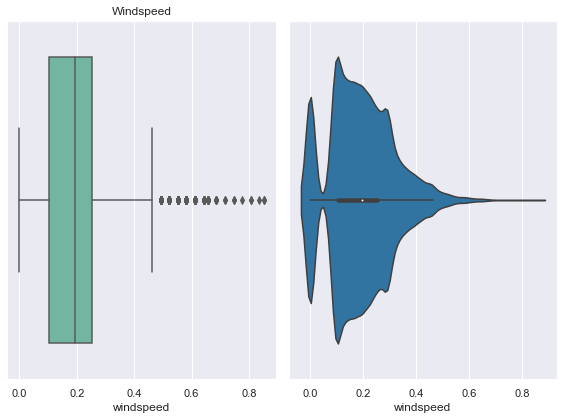

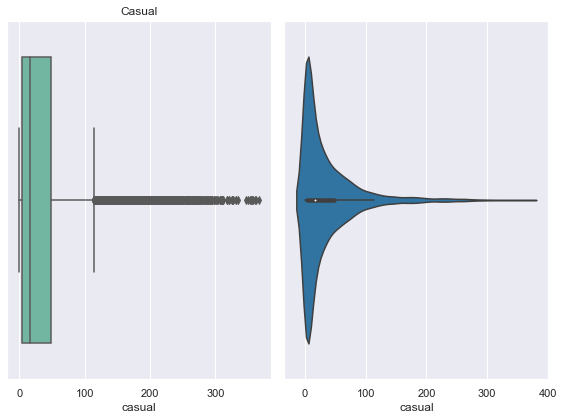

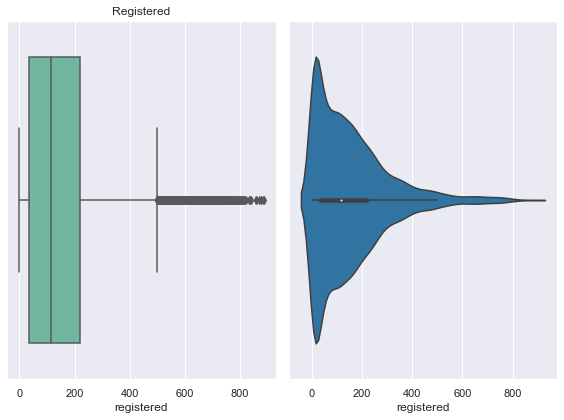

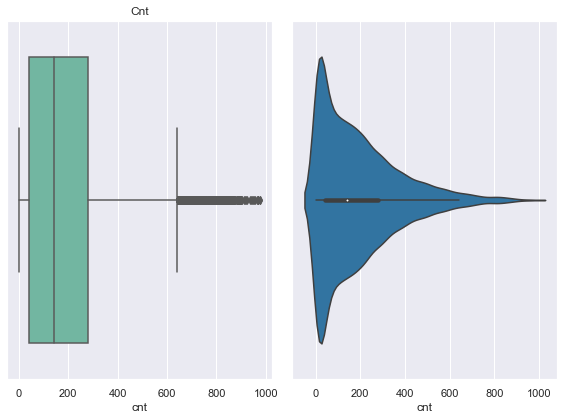

In [120]:
for i in bike_rental.columns[2:]:
    num_dist(i,bike_rental)

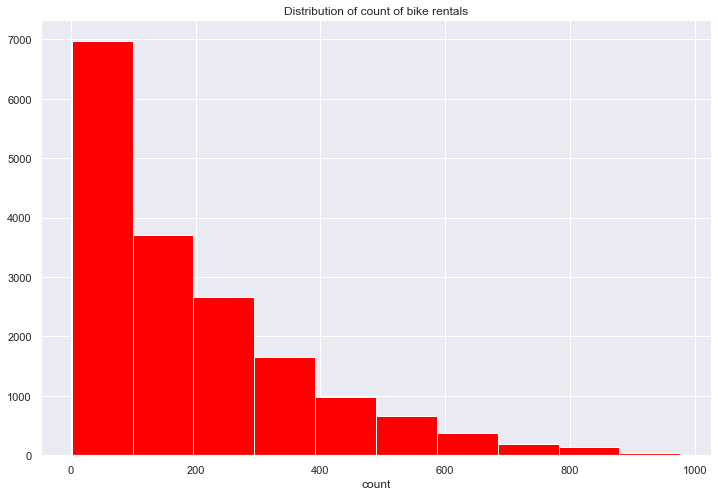

In [121]:
plt.figure(figsize = (12,8))
plt.hist(bike_rental['cnt'],color = 'red')
plt.title('Distribution of count of bike rentals')
plt.xlabel('count')
plt.show()

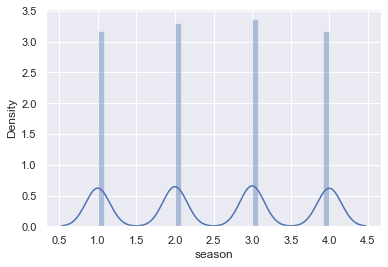

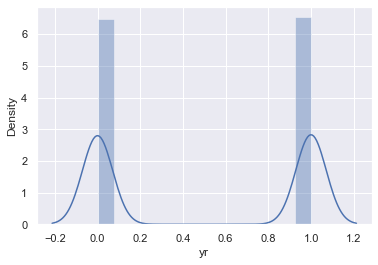

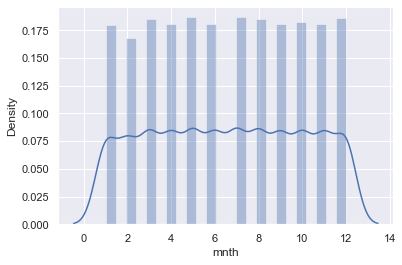

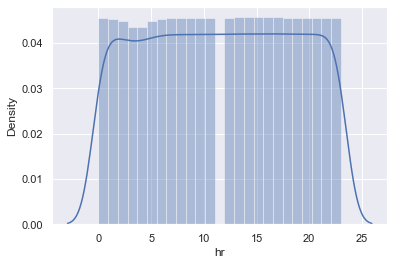

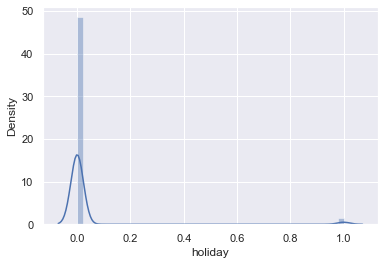

...

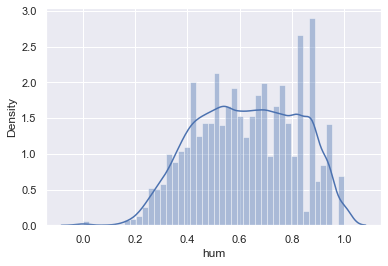

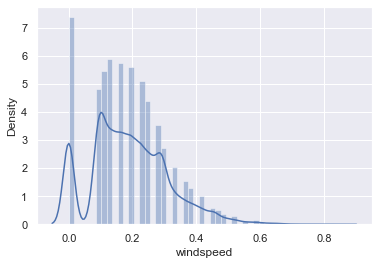

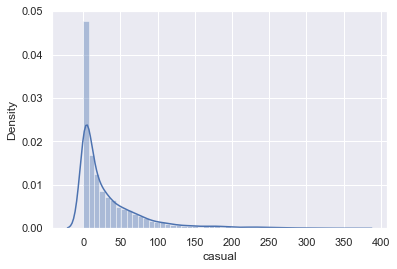

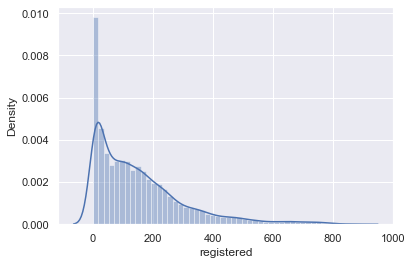

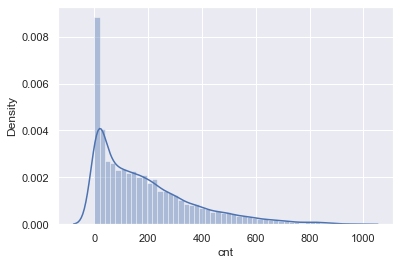

In [122]:
def distplots(df,col):
    sns.distplot(df[col],kde = True)
    plt.show()
    
for col in bike_rental.columns[2:]:
    distplots(bike_rental,col)
    

## Bivariate analysis

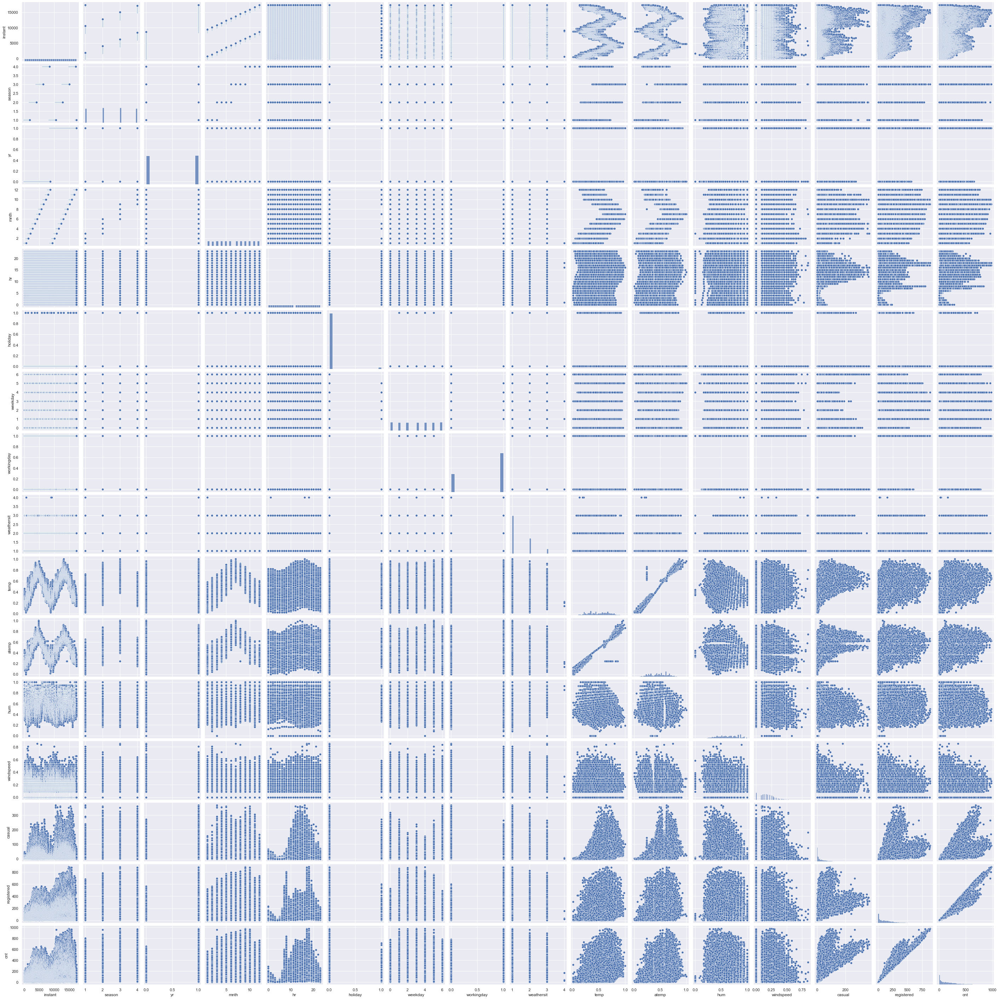

In [254]:
sns.pairplot(bike_rental)

In [124]:
bike_rental.head()

,instant,dteday,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
0,1,2011-01-01,1,0,1,0,0,6,0,1,0.24,0.2879,0.81,0.0,3,13,16
1,2,2011-01-01,1,0,1,1,0,6,0,1,0.22,0.2727,0.80,0.0,8,32,40
2,3,2011-01-01,1,0,1,2,0,6,0,1,0.22,0.2727,0.80,0.0,5,27,32
3,4,2011-01-01,1,0,1,3,0,6,0,1,0.24,0.2879,0.75,0.0,3,10,13
4,5,2011-01-01,1,0,1,4,0,6,0,1,0.24,0.2879,0.75,0.0,0,1,1


In [125]:
cat_columns = []

for i in bike_rental.columns[2:]:
    if len(bike_rental[i].unique()) < 14:
        cat_columns.append(i)
        
cat_columns

['season', 'yr', 'mnth', 'holiday', 'weekday', 'workingday', 'weathersit']

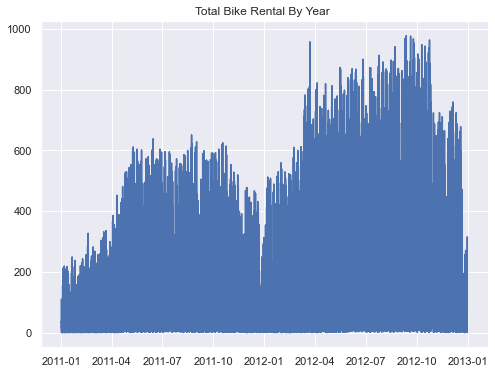

In [126]:
plt.figure(figsize = (8,6))
plt.plot(bike_rental['dteday'],bike_rental['cnt'])
plt.title('Total Bike Rental By Year ')
plt.show()

**Looking at the entire two-year period, we see the number of rented bikes is at its lowest during the winter months and at its highest during the summer (Capital Bikeshare operates only in the northern hemisphere, so the summer months are June-August, and the winter months are December-February).**

In fact, we see quite a few similar patterns for both 2011 and 2012 with respect to the number of rented bikes:

1. The number keeps increasing in the January-May interval.
2. We see a plateau in the May-September interval, where the number of rentals stays high but constant (it neither increases nor decreases very much).
3. The number keeps decreasing in the September-December interval.

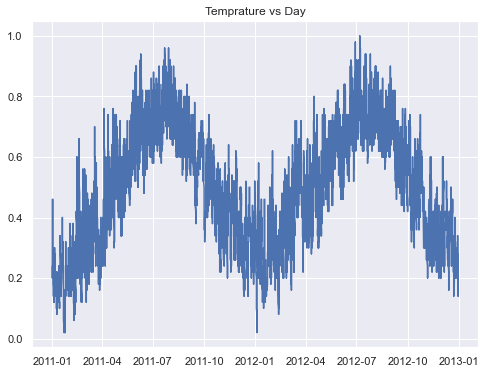

In [127]:
plt.figure(figsize = (8,6))
plt.plot(bike_rental['dteday'],bike_rental['temp'])
plt.title('Temprature vs Day')
plt.show()

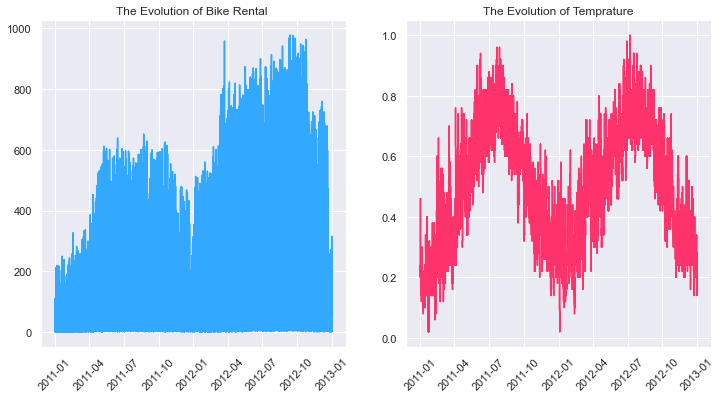

In [128]:
plt.figure(figsize = (12,6))
plt.subplot(1,2,1)
plt.plot(bike_rental['dteday'],bike_rental['cnt'],color = '#33A8FF')
plt.title('The Evolution of Bike Rental ')
plt.xticks(rotation = 45)

plt.subplot(1,2,2)
plt.plot(bike_rental['dteday'],bike_rental['temp'],color = '#FF336B')
plt.title('The Evolution of Temprature')
plt.xticks(rotation = 45)
plt.show()


**we identified a few seasonal trends. We hypothesized that this seasonality might be related to temperature variations.The similarity in how the air temperature and the number of rented bikes changed over 2011 and 2012 supports this hypothesis.**


1. As we can see when temprature increases the number of bike rentals also increasing and as temprature decreases the number of bike rentals is also decreasing.

In [260]:
cat_columns

['season', 'yr', 'mnth', 'holiday', 'weekday', 'workingday', 'weathersit']

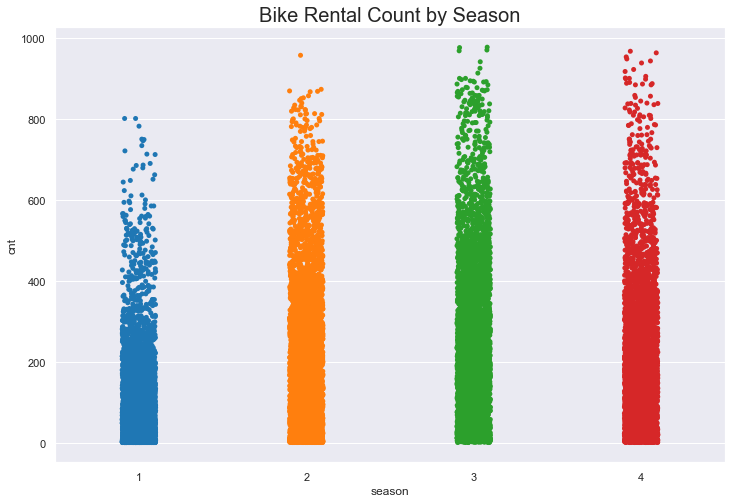

In [294]:
plt.figure(figsize = (12,8))
sns.stripplot(x = bike_rental['season'],y = bike_rental['cnt'],palette = 'tab10')
plt.title('Bike Rental Count by Season',loc = 'center',fontsize = 20)
plt.show()

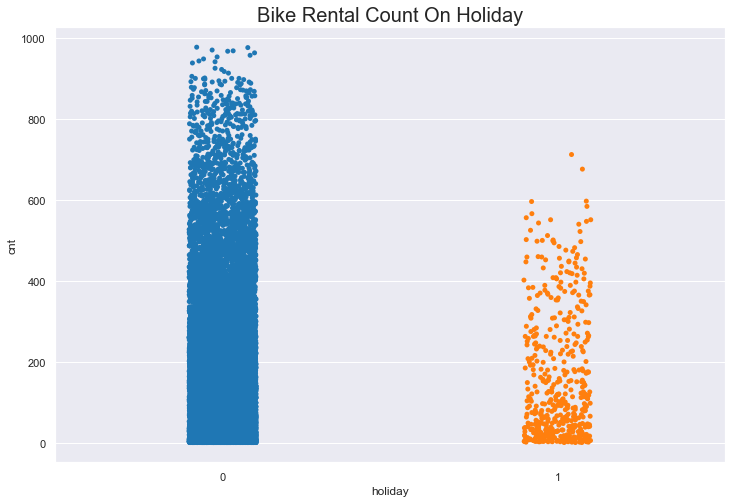

In [295]:
plt.figure(figsize = (12,8))
sns.stripplot(x = bike_rental['holiday'],y = bike_rental['cnt'],palette = 'tab10')
plt.title('Bike Rental Count On Holiday',loc = 'center',fontsize = 20)
plt.show()

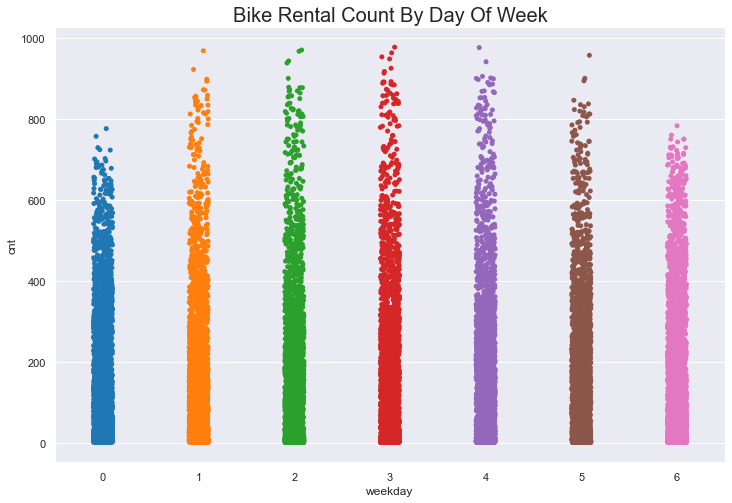

In [297]:
plt.figure(figsize = (12,8))
sns.stripplot(x = bike_rental['weekday'],y = bike_rental['cnt'],palette = 'tab10')
plt.title('Bike Rental Count By Day Of Week',loc = 'center',fontsize = 20)
plt.show()

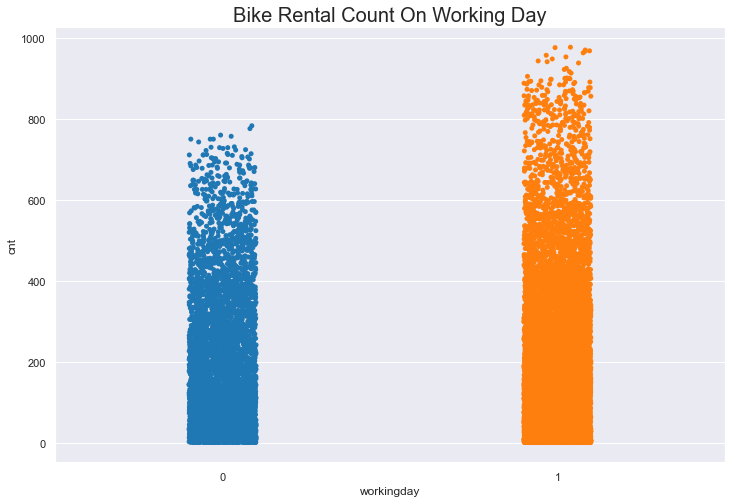

In [298]:
plt.figure(figsize = (12,8))
sns.stripplot(x = bike_rental['workingday'],y = bike_rental['cnt'],palette = 'tab10')
plt.title('Bike Rental Count On Working Day',loc = 'center',fontsize = 20)
plt.show()

In [130]:
bike_rental.corr()['cnt'].sort_values(ascending = False)

cnt           1.000000
registered    0.972151
casual        0.694564
temp          0.404772
atemp         0.400929
hr            0.394071
instant       0.278379
yr            0.250495
season        0.178056
mnth          0.120638
windspeed     0.093234
workingday    0.030284
weekday       0.026900
holiday      -0.030927
weathersit   -0.142426
hum          -0.322911
Name: cnt, dtype: float64

<AxesSubplot:>

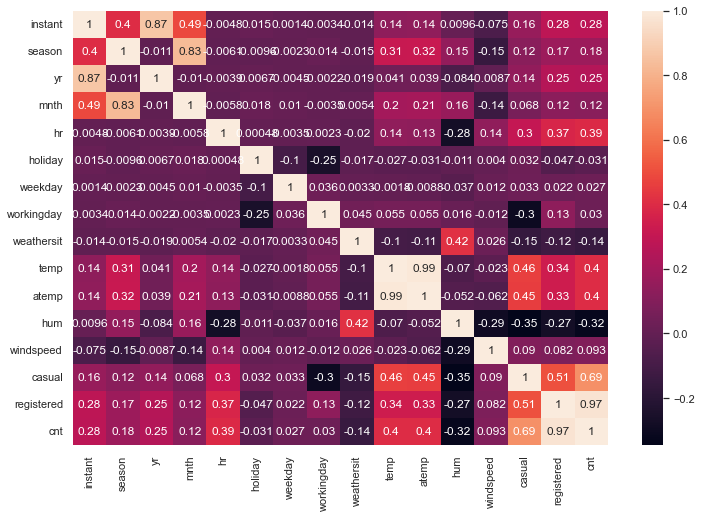

In [131]:
plt.figure(figsize = (12,8))
sns.heatmap(bike_rental.corr(),annot = True)

In [132]:
def assign_label(num):
    if num >=0 and num < 6:
        return 4
    elif num >=6 and num < 12:
        return 1
    elif num >=12 and num < 18:
        return 2 
    elif num >=18 and num < 24:
        return 3

In [133]:
df = bike_rental.copy()
df['hr'] = df['hr'].apply(assign_label)

In [134]:
df['hr'].value_counts()

2    4375
3    4368
1    4360
4    4276
Name: hr, dtype: int64

## Splitting the data into train and test

In [234]:
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVR
from sklearn.metrics import mean_squared_error,r2_score
from sklearn.neighbors import KNeighborsRegressor

In [138]:
df = bike_rental.drop(['instant','dteday','atemp','casual','registered'],axis = 1)

In [139]:
train = df.sample(frac = 0.8)
test = df.loc[~df.index.isin(train.index)]

In [140]:
preditors = list(train.columns[:-1])
preditors

['season',
 'yr',
 'mnth',
 'hr',
 'holiday',
 'weekday',
 'workingday',
 'weathersit',
 'temp',
 'hum',
 'windspeed']

## Error Metric
The mean squared error metric makes the most sense to evaluate our error. MSE works on continuous numeric data, which fits our data quite well.

In [237]:
Train_Accuracy = []
Test_Accuracy = []
Variance = []
mse_error = []
model_n = []
def prediction(model,model_name):
    model.fit(train[preditors],train['cnt'])
    prediction_train = model.predict(train[preditors])
    prediction_test = model.predict(test[preditors])
    
    mse = mean_squared_error(test['cnt'],prediction_test)
    training_score = r2_score(train['cnt'],prediction_train)
    testing_score = r2_score(test['cnt'],prediction_test)
    variance = np.abs(training_score - testing_score)
    
    Train_Accuracy.append(training_score.round(2)*100)
    Test_Accuracy.append(testing_score.round(2)*100)
    Variance.append(variance.round(2)*100)
    mse_error.append(mse)
    model_n.append(model_name)
    
    if (variance > 9):
        print(f'ATTENTION!!! : The {model_name} is overfitting')
        
    print()
     
    print('Mean Squared Error : ',mse)
    print('Training Accuracy :',training_score)
    print('Testing Accuracy : ',testing_score)

## Linear Regression

In [238]:
lr = LinearRegression()
prediction(lr,'LinearRegression')


Mean Squared Error :  20037.91071482854
Training Accuracy : 0.38593372607736953
Testing Accuracy :  0.39451137227041944


## Decision Tree

In [239]:
dt = DecisionTreeRegressor(min_samples_leaf = 5)
prediction(dt,'DecisionTree')


Mean Squared Error :  2603.449154074426
Training Accuracy : 0.9623336090817509
Testing Accuracy :  0.9213311767829309


## RandomForest

In [240]:
reg = RandomForestRegressor(n_estimators = 200,min_samples_leaf=5)
prediction(reg,'RandomForest')


Mean Squared Error :  1850.3771362557281
Training Accuracy : 0.9631396424208852
Testing Accuracy :  0.9440868696862412


## KNearestNeighbors

In [241]:
error_rate = []
for i in range(1,40,2):
    knn = KNeighborsRegressor(i)
    knn.fit(train[preditors],train['cnt'])
    pred_i = knn.predict(test[preditors])
    mse_knn = mean_squared_error(test['cnt'],pred_i)
    error_rate.append(mse_knn)

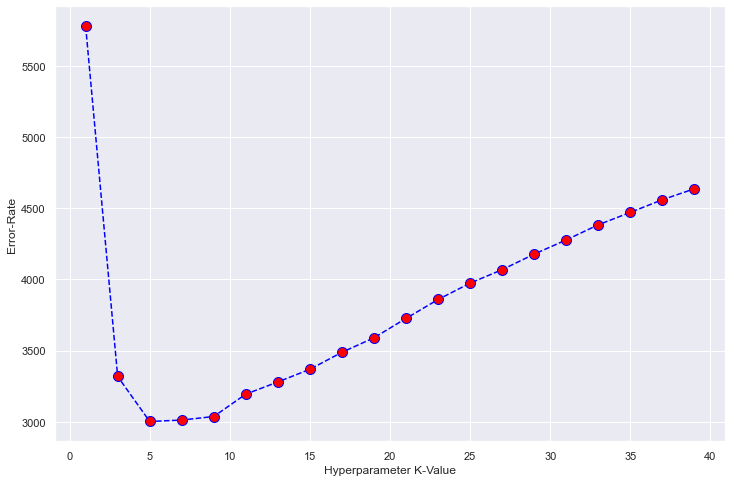

In [242]:
plt.figure(figsize = (12,8))
plt.plot(range(1,40,2),error_rate,color= 'blue',linestyle = 'dashed',marker = 'o',markerfacecolor = 'red',markersize = 10)
plt.xlabel('Hyperparameter K-Value')
plt.ylabel('Error-Rate')
plt.show()

In [243]:
knn = KNeighborsRegressor(7)
prediction(knn,'KNN')


Mean Squared Error :  3011.507010168855
Training Accuracy : 0.9348767262004627
Testing Accuracy :  0.9090008298302394


In [244]:
metrics_1 = {'Model':model_n,'Train_Accuracy':Train_Accuracy,'Test_Accuracy':Test_Accuracy,'Variance':Variance,'MSE':mse_error}
metric_df = pd.DataFrame(metrics_1)
metric_df

,Model,Train_Accuracy,Test_Accuracy,Variance,MSE
0,LinearRegression,39.0,39.0,1.0,20037.910715
1,DecisionTree,96.0,92.0,4.0,2603.449154
2,RandomForest,96.0,94.0,2.0,1850.377136
3,KNN,93.0,91.0,3.0,3011.507010


## Observation of the Model Building 

**1. Linear Regression is not suitable model as the Train and Test Accuracy is below 60% and MSE is quite high.Which infers there is no linear releationship between preditors and target column.**

**2. The variance is minimum in case of DecisionTree,RandomForest and KNN as well as Training and Testing Accuracy is also good.**

**3. With min_sample_leaf of 5 we get better result in Random Forest as well as Decision Tree.But Random Forest is giving slightly better result with low variance.**

**4. Random forests tend to be much more accurate than simple models like linear regression. Due to the way random forests are constructed, they tend to overfit much less than decision trees. Random forests are prone to overfitting.**

**5. Hence We reached to the conclusion that RandomForest model is the best fit model for bike rental prediction.**